In [41]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

from sklearn.preprocessing import QuantileTransformer
from smote_variants.visualization import plot_raw

import gc

%matplotlib inline

In [20]:
def change_datatype(df):
    int8_vals = np.iinfo(np.int8)
    int16_vals = np.iinfo(np.int16)
    int32_vals = np.iinfo(np.int32)

    float16_vals = np.finfo(np.float16)
    float32_vals = np.finfo(np.float32)
    
    for col in df.columns:
        max_val = df[col].max()
        min_val = df[col].min()

        # print(f"{col}: max {max_val} -- min {min_val}")
        
        if df[col].dtype == np.int64:
            if max_val <= int8_vals.max and min_val >= int8_vals.min:
                df[col] = df[col].astype(np.int8)
            elif max_val <= int16_vals.max and min_val >= int16_vals.min:
                df[col] = df[col].astype(np.int16)
            elif max_val <= int32_vals.max and min_val >= int32_vals.min:
                df[col] = df[col].astype(np.int32)

        elif df[col].dtype == np.float64:
            if max_val <= float16_vals.max and min_val >= float16_vals.min:
                df[col] = df[col].astype(np.float16)
            elif max_val <= float32_vals.max and min_val >= float32_vals.min:
                df[col] = df[col].astype(np.float32)
    return df

#### Original data

In [21]:
original_df = pd.read_csv("./raw/raw_cutoff_trainset.csv")
original_df = change_datatype(original_df)

In [22]:
original_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1251919 entries, 0 to 1251918
Data columns (total 70 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   Unnamed: 0                   1251919 non-null  int32  
 1   destination_port             1251919 non-null  int32  
 2   flow_duration                1251919 non-null  int32  
 3   total_fwd_packets            1251919 non-null  int32  
 4   total_backward_packets       1251919 non-null  int32  
 5   total_length_of_fwd_packets  1251919 non-null  int32  
 6   total_length_of_bwd_packets  1251919 non-null  int32  
 7   fwd_packet_length_max        1251919 non-null  int16  
 8   fwd_packet_length_min        1251919 non-null  int16  
 9   fwd_packet_length_mean       1251919 non-null  float16
 10  fwd_packet_length_std        1251919 non-null  float16
 11  bwd_packet_length_max        1251919 non-null  int16  
 12  bwd_packet_length_min        1251919 non-n

In [23]:
original_df = original_df.drop('Unnamed: 0', axis = 1)

In [24]:
labels_mapping = {
    0 : "BENIGN" ,
    1 : "DDoS" ,
    2 : 'DoS',
    3 : "Brute Force",
    4 : "Bot",
    5 : "Web Attack",
    6 : "Infiltration",
    7 : "PortScan",
    8 : "Patator",
    9 : "Heartbleed"
}

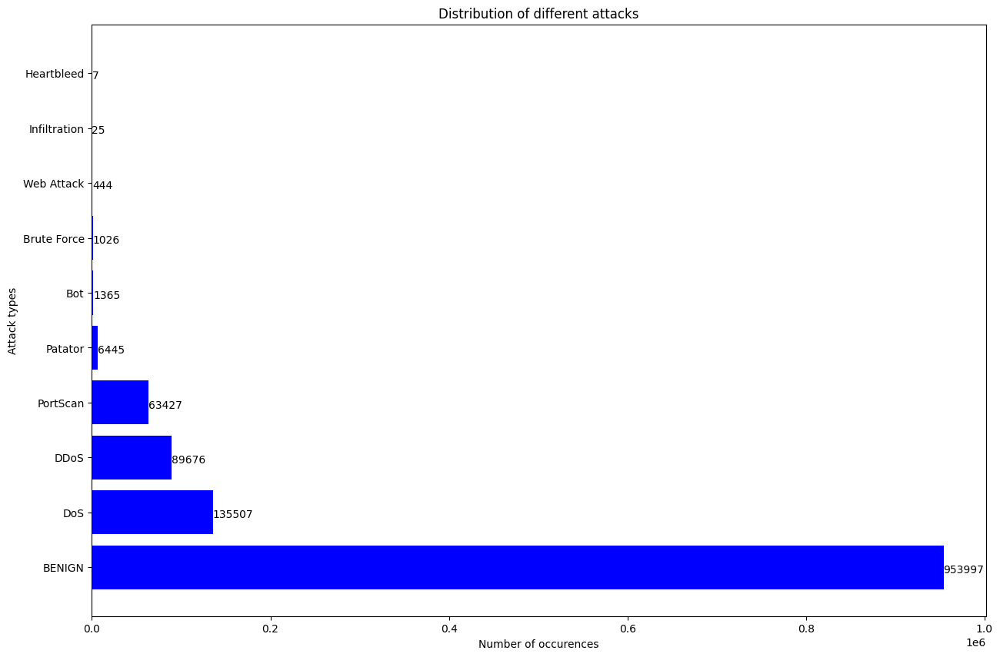

In [26]:
plt.figure(figsize = (15,10))

label_counts = original_df['label'].value_counts()
order = [labels_mapping[i] for i in label_counts.index]

y_pos = np.arange(len(order)) 
plt.barh(y_pos, label_counts, align = 'center', color = 'blue' )
plt.yticks(y_pos, order)
plt.title('Distribution of different attacks')
plt.xlabel('Number of occurences')
plt.ylabel('Attack types')

for i, v in enumerate(label_counts):
    plt.text(v + 3, i - 0.1 , str(v))
    
plt.show()

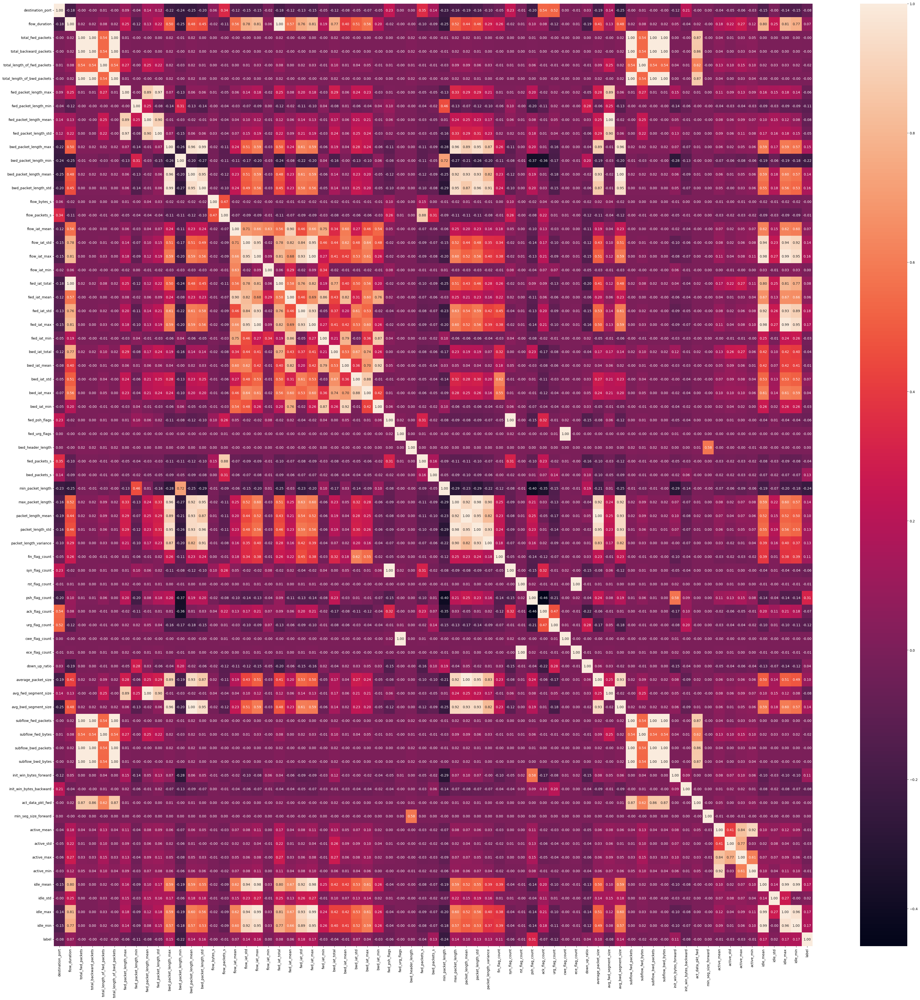

In [27]:
plt.figure(figsize = (50, 50)) 
sns.heatmap(original_df.corr(), annot = True, fmt = ".2f")
plt.show()

In [35]:
scaler = QuantileTransformer(
       n_quantiles = 10000,
       random_state = 6969,
       output_distribution = "uniform"
)

In [29]:
X_origin = original_df.drop("label", axis = 1)
y_origin = original_df['label']

In [36]:
X_origin_scaler = scaler.fit_transform(X_origin)

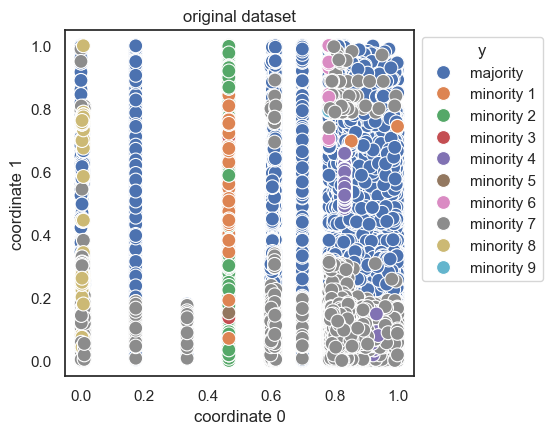

In [39]:
fig = plot_raw(X_origin_scaler, y_origin, "original dataset")

In [40]:
del fig, X_origin_scaler, X_origin, y_origin, original_df

In [42]:
gc.collect()

3970

#### Oversampling: `SMOTE`

In [43]:
smote_df = pd.read_csv("./oversampling/smote_standardscaling_trainset.csv")
smote_df = change_datatype(smote_df)

In [44]:
smote_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14676870 entries, 0 to 14676869
Data columns (total 70 columns):
 #   Column                       Dtype  
---  ------                       -----  
 0   Unnamed: 0                   int32  
 1   destination_port             float16
 2   flow_duration                float16
 3   total_fwd_packets            float16
 4   total_backward_packets       float16
 5   total_length_of_fwd_packets  float16
 6   total_length_of_bwd_packets  float16
 7   fwd_packet_length_max        float16
 8   fwd_packet_length_min        float16
 9   fwd_packet_length_mean       float16
 10  fwd_packet_length_std        float16
 11  bwd_packet_length_max        float16
 12  bwd_packet_length_min        float16
 13  bwd_packet_length_mean       float16
 14  bwd_packet_length_std        float16
 15  flow_bytes_s                 float16
 16  flow_packets_s               float16
 17  flow_iat_mean                float16
 18  flow_iat_std                 float16
 19

In [45]:
smote_df = smote_df.drop('Unnamed: 0', axis = 1)

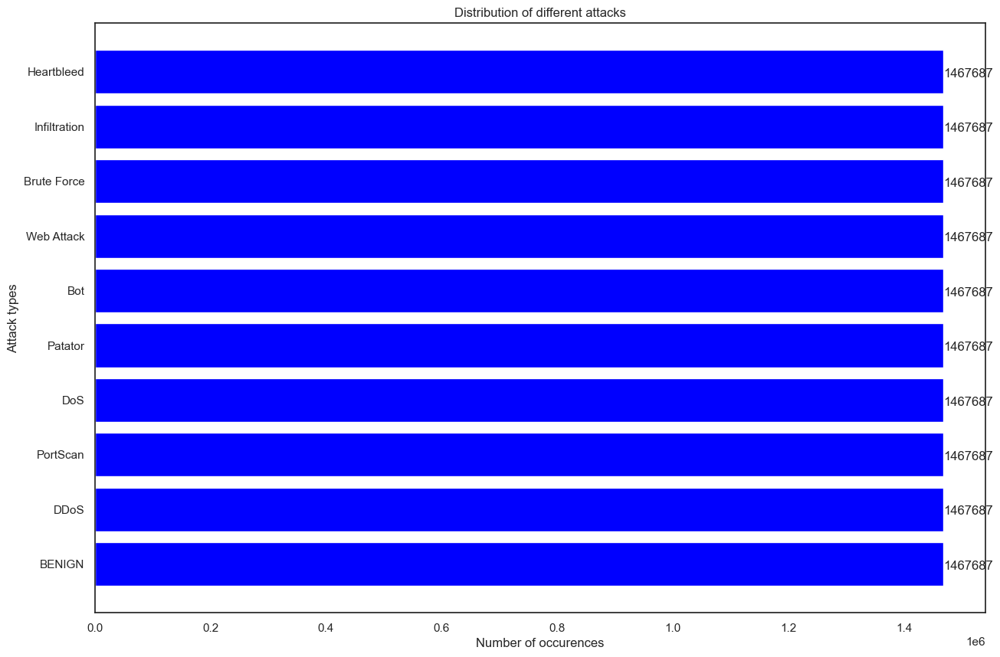

In [46]:
plt.figure(figsize = (15,10))

label_counts = smote_df['label'].value_counts()
order = [labels_mapping[i] for i in label_counts.index]

y_pos = np.arange(len(order)) 
plt.barh(y_pos, label_counts, align = 'center', color = 'blue' )
plt.yticks(y_pos, order)
plt.title('Distribution of different attacks')
plt.xlabel('Number of occurences')
plt.ylabel('Attack types')

for i, v in enumerate(label_counts):
    plt.text(v + 3, i - 0.1 , str(v))
    
plt.show()

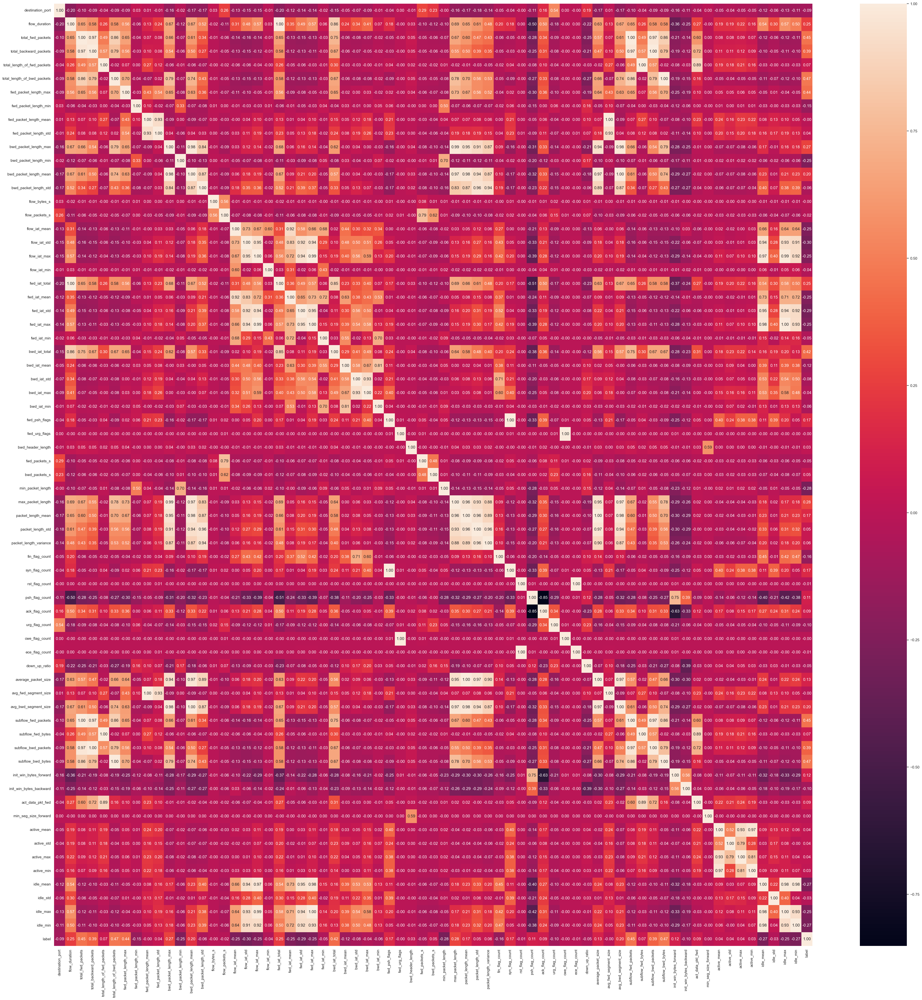

In [47]:
plt.figure(figsize = (50, 50)) 
sns.heatmap(smote_df.corr(), annot = True, fmt = ".2f")
plt.show()

=> Dataset xuất hiện high corr ở `max_packet_lenght`, `packet_lenght_mean`, `packet_lenght_std`, `packet_lenght_variance`, `bwd_packet_lenght_max`, `bwd_packet_lenght_max_mean`, `bwd_packet_lenght_max_std`, `avg_packet_size`, `avg_bwd_segment_size`,...

In [48]:
X_smote = smote_df.drop("label", axis = 1)
y_smote = smote_df['label']

In [49]:
X_smote_scaler = scaler.fit_transform(X_smote)

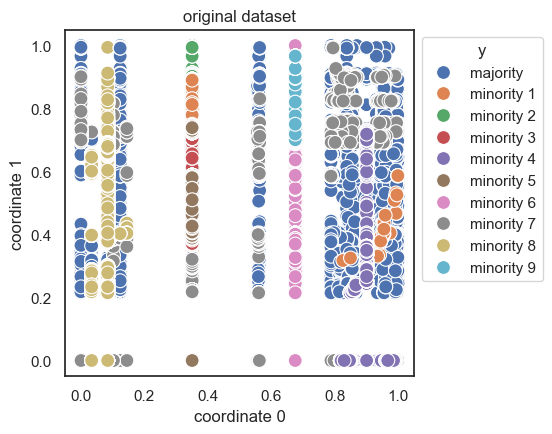

In [51]:
fig = plot_raw(X_smote_scaler, y_smote, "original dataset")

In [ ]:
del X_smote, y_smote, X_smote_scaler, smote_df
gc.collect()

#### Oversampling: ADASYN

In [54]:
adasyn_df = pd.read_csv("./oversampling/ADASYN_trainset.csv")
adasyn_df = change_datatype(adasyn_df)

In [56]:
adasyn_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9539966 entries, 0 to 9539965
Data columns (total 71 columns):
 #   Column                       Dtype  
---  ------                       -----  
 0   Unnamed: 0.1                 int32  
 1   Unnamed: 0                   float32
 2   destination_port             float32
 3   flow_duration                float32
 4   total_fwd_packets            float32
 5   total_backward_packets       float32
 6   total_length_of_fwd_packets  float32
 7   total_length_of_bwd_packets  float32
 8   fwd_packet_length_max        float16
 9   fwd_packet_length_min        float16
 10  fwd_packet_length_mean       float16
 11  fwd_packet_length_std        float16
 12  bwd_packet_length_max        float16
 13  bwd_packet_length_min        float16
 14  bwd_packet_length_mean       float16
 15  bwd_packet_length_std        float16
 16  flow_bytes_s                 float32
 17  flow_packets_s               float32
 18  flow_iat_mean                float32
 19  

In [57]:
adasyn_df = adasyn_df.drop('Unnamed: 0', axis = 1)

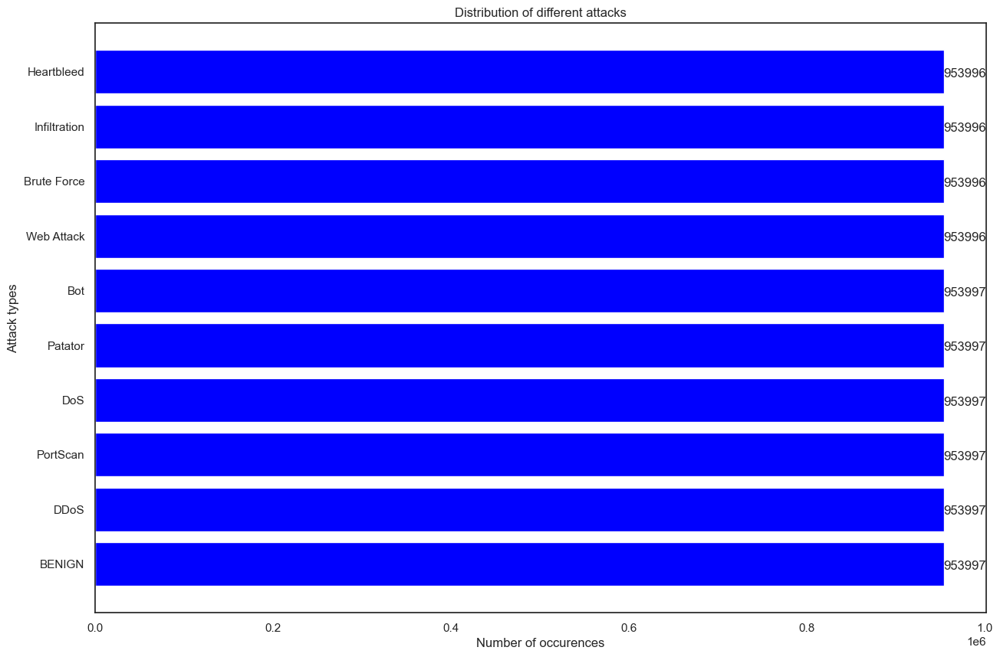

In [58]:
plt.figure(figsize = (15,10))

label_counts = adasyn_df['label'].value_counts()
order = [labels_mapping[i] for i in label_counts.index]

y_pos = np.arange(len(order)) 
plt.barh(y_pos, label_counts, align = 'center', color = 'blue' )
plt.yticks(y_pos, order)
plt.title('Distribution of different attacks')
plt.xlabel('Number of occurences')
plt.ylabel('Attack types')

for i, v in enumerate(label_counts):
    plt.text(v + 3, i - 0.1 , str(v))
    
plt.show()

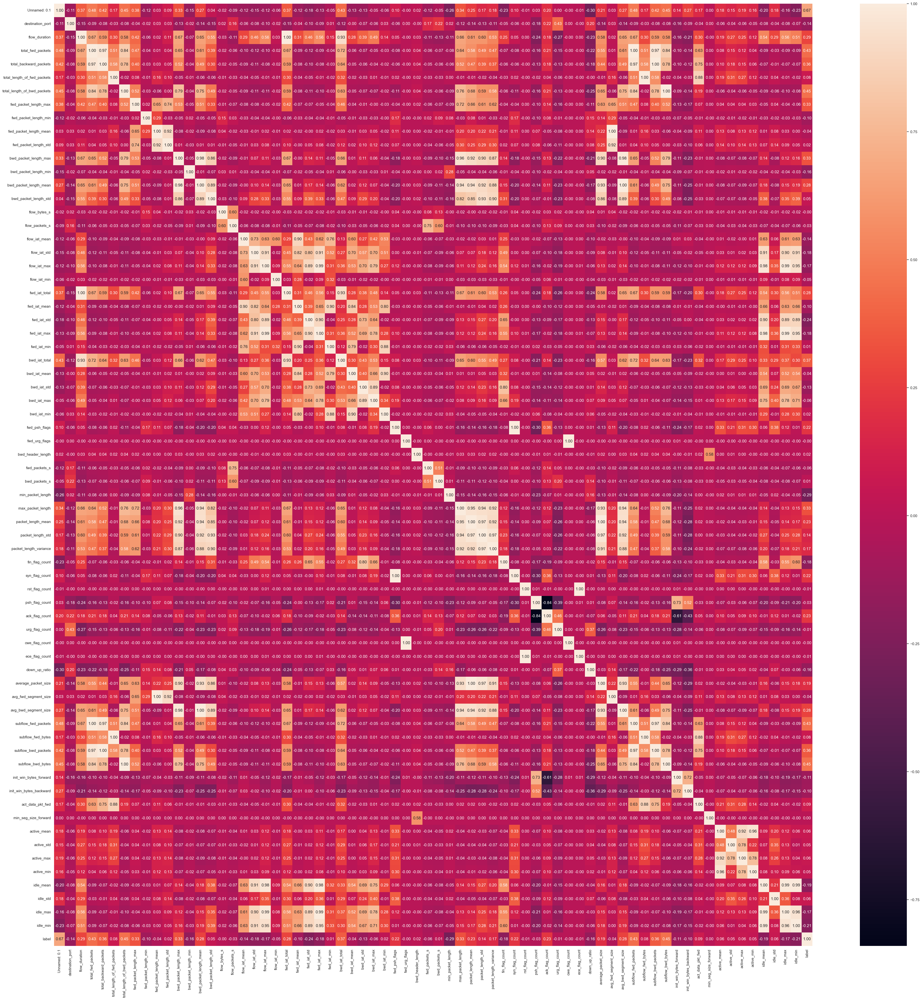

In [59]:
plt.figure(figsize = (50, 50)) 
sns.heatmap(adasyn_df.corr(), annot = True, fmt = ".2f")
plt.show()

In [60]:
X_adasyn = adasyn_df.drop("label", axis = 1)
y_adasyn = adasyn_df['label']

In [61]:
X_adasyn_scaler = scaler.fit_transform(X_adasyn)

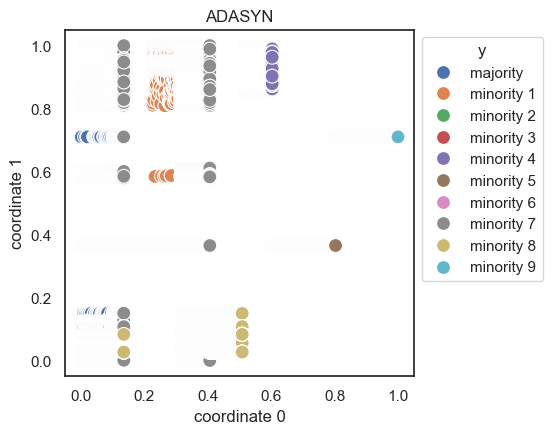

In [62]:
fig = plot_raw(X_adasyn_scaler, y_adasyn, "ADASYN")

In [63]:
del X_adasyn, y_adasyn, X_adasyn_scaler, adasyn_df
gc.collect()

316115

##### Oversampling: NRAS

In [64]:
nras_df = pd.read_csv("./oversampling/NRAS_trainset.csv")
nras_df = change_datatype(nras_df)

In [65]:
nras_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9539966 entries, 0 to 9539965
Data columns (total 70 columns):
 #   Column                       Dtype  
---  ------                       -----  
 0   Unnamed: 0                   int32  
 1   destination_port             float32
 2   flow_duration                float32
 3   total_fwd_packets            float32
 4   total_backward_packets       float32
 5   total_length_of_fwd_packets  float32
 6   total_length_of_bwd_packets  float32
 7   fwd_packet_length_max        float16
 8   fwd_packet_length_min        float16
 9   fwd_packet_length_mean       float16
 10  fwd_packet_length_std        float16
 11  bwd_packet_length_max        float16
 12  bwd_packet_length_min        float16
 13  bwd_packet_length_mean       float16
 14  bwd_packet_length_std        float16
 15  flow_bytes_s                 float32
 16  flow_packets_s               float32
 17  flow_iat_mean                float32
 18  flow_iat_std                 float32
 19  

In [67]:
nras_df = nras_df.drop('Unnamed: 0', axis = 1)

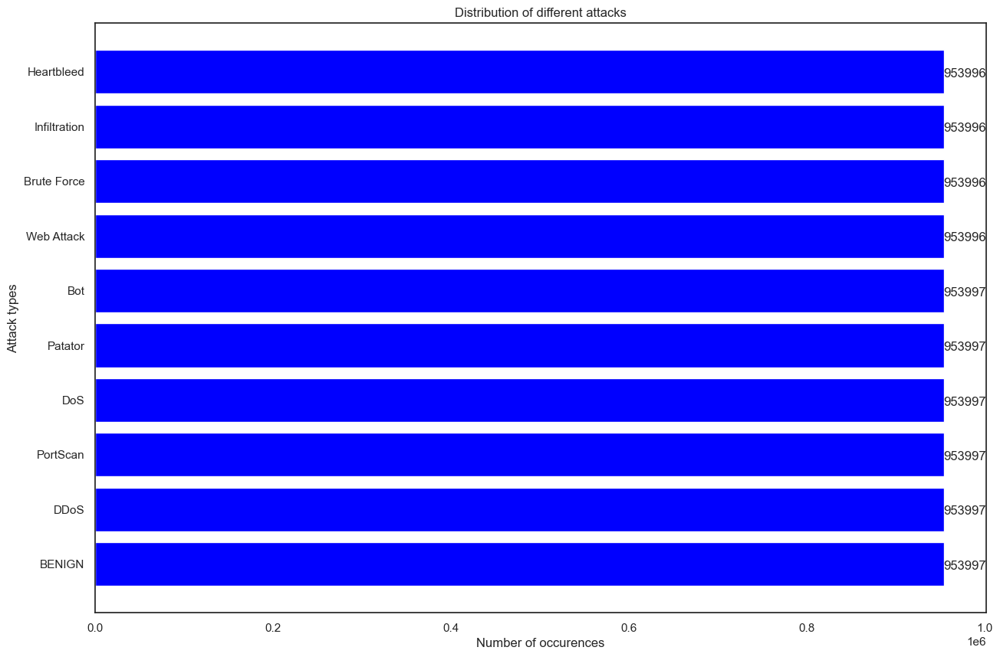

In [72]:
plt.figure(figsize = (15,10))

label_counts = nras_df['label'].value_counts()
order = [labels_mapping[i] for i in label_counts.index]

y_pos = np.arange(len(order)) 
plt.barh(y_pos, label_counts, align = 'center', color = 'blue' )
plt.yticks(y_pos, order)
plt.title('Distribution of different attacks')
plt.xlabel('Number of occurences')
plt.ylabel('Attack types')

for i, v in enumerate(label_counts):
    plt.text(v + 3, i - 0.1 , str(v))
    
plt.show()

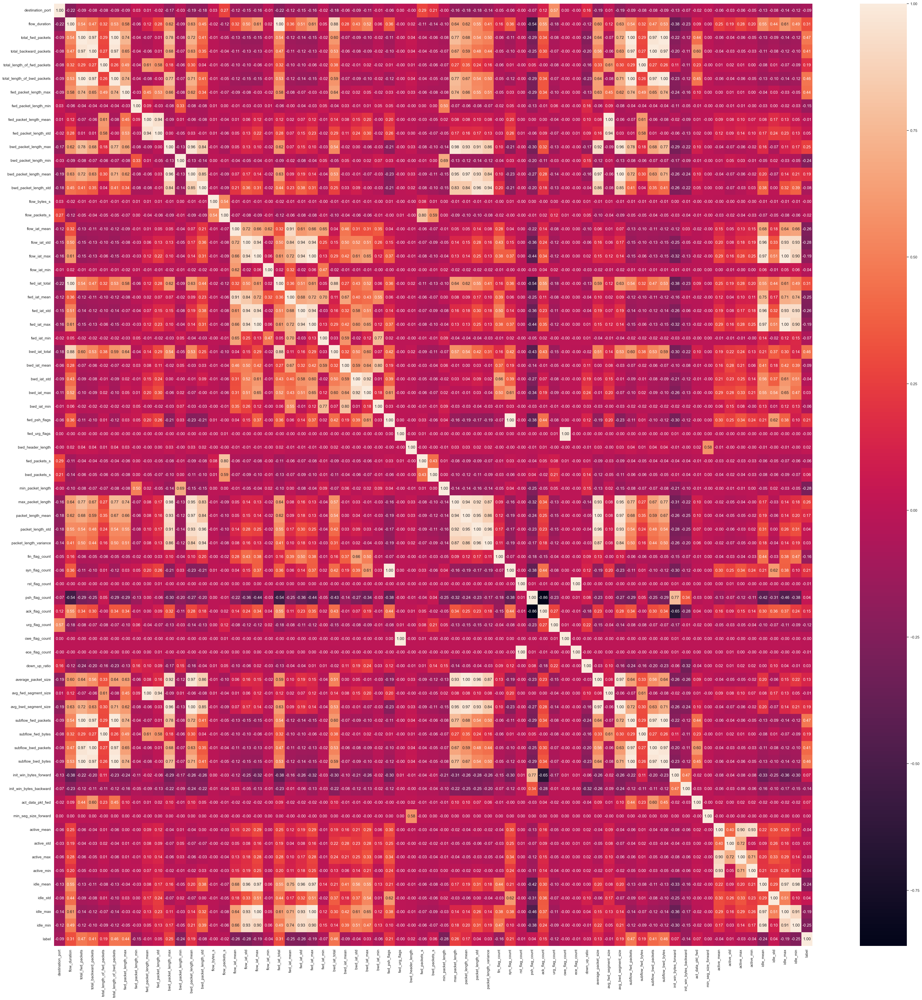

In [69]:
plt.figure(figsize = (50, 50)) 
sns.heatmap(nras_df.corr(), annot = True, fmt = ".2f")
plt.show()

In [70]:
X_nras = nras_df.drop("label", axis = 1)
y_nras = nras_df['label']

In [71]:
X_nras_scaler = scaler.fit_transform(X_nras)

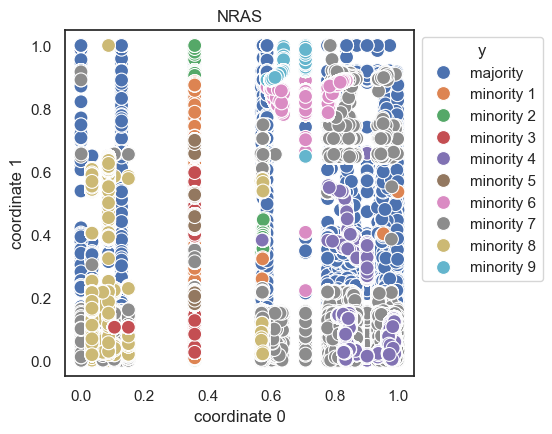

In [73]:
fig = plot_raw(X_nras_scaler, y_nras, "NRAS")